In [3]:
import warnings
import tensorflow_datasets as tfds
warnings.filterwarnings("ignore")

In [4]:
# 데이터셋 로드
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True
)


print(metadata)

tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_path='/aiffel/tensorflow_datasets/tf_flowers/3.0.1',
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)


In [5]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [6]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

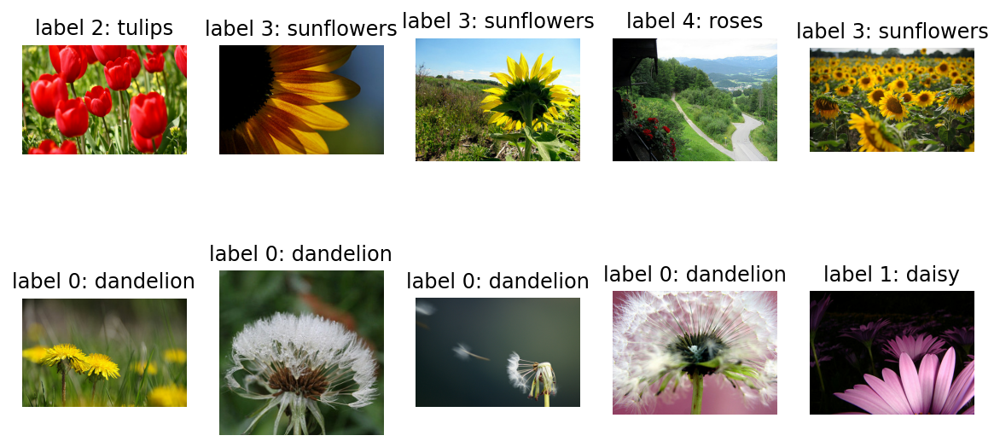

In [7]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [8]:
IMG_SIZE = 224 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [9]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((224, 224, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((224, 224, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((224, 224, 3), ()), types: (tf.float32, tf.int64)>


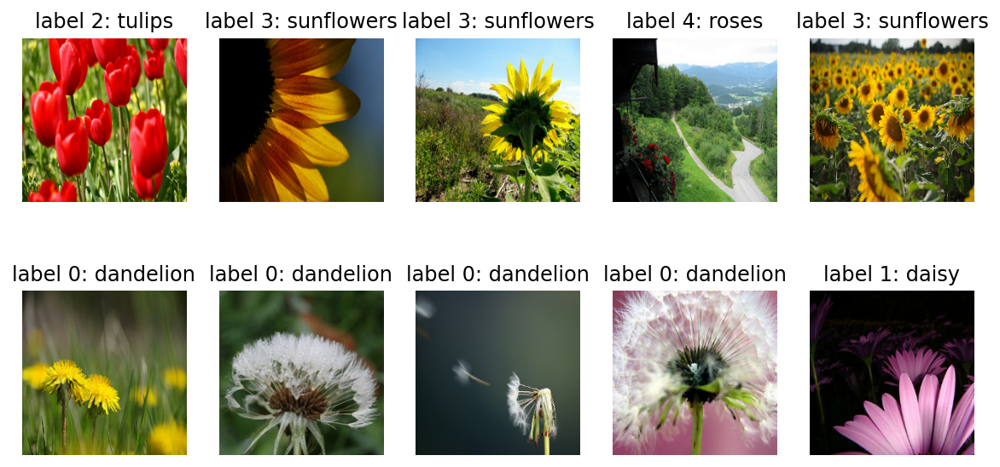

In [10]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [12]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [13]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [14]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32]))

In [45]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')

In [46]:
image_batch.shape

TensorShape([32, 224, 224, 3])

In [47]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 7, 7, 512])

In [48]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [49]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [50]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [51]:
dense_layer = tf.keras.layers.Dense(units = 512, activation = 'relu')
prediction_layer = tf.keras.layers.Dense(units = 5, activation = 'softmax')

prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [52]:
base_model.trainable = False

In [53]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [54]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_7 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [55]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [56]:
EPOCHS = 30
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/30
92/92 [==============================] - 15s 148ms/step - loss: 1.3658 - accuracy: 0.5272 - val_loss: 1.1555 - val_accuracy: 0.7084
Epoch 2/30
92/92 [==============================] - 14s 147ms/step - loss: 1.0486 - accuracy: 0.7064 - val_loss: 0.9225 - val_accuracy: 0.7384
Epoch 3/30
92/92 [==============================] - 14s 150ms/step - loss: 0.8734 - accuracy: 0.7401 - val_loss: 0.8046 - val_accuracy: 0.7466
Epoch 4/30
92/92 [==============================] - 15s 152ms/step - loss: 0.7625 - accuracy: 0.7667 - val_loss: 0.7279 - val_accuracy: 0.7657
Epoch 5/30
92/92 [==============================] - 15s 157ms/step - loss: 0.6904 - accuracy: 0.7854 - val_loss: 0.6503 - val_accuracy: 0.7875
Epoch 6/30
92/92 [==============================] - 15s 159ms/step - loss: 0.6362 - accuracy: 0.7973 - val_loss: 0.6191 - val_accuracy: 0.7902
Epoch 7/30
92/92 [==============================] - 15s 162ms/step - loss: 0.5993 - accuracy: 0.8082 - val_loss: 0.5849 - val_accuracy: 0.8065

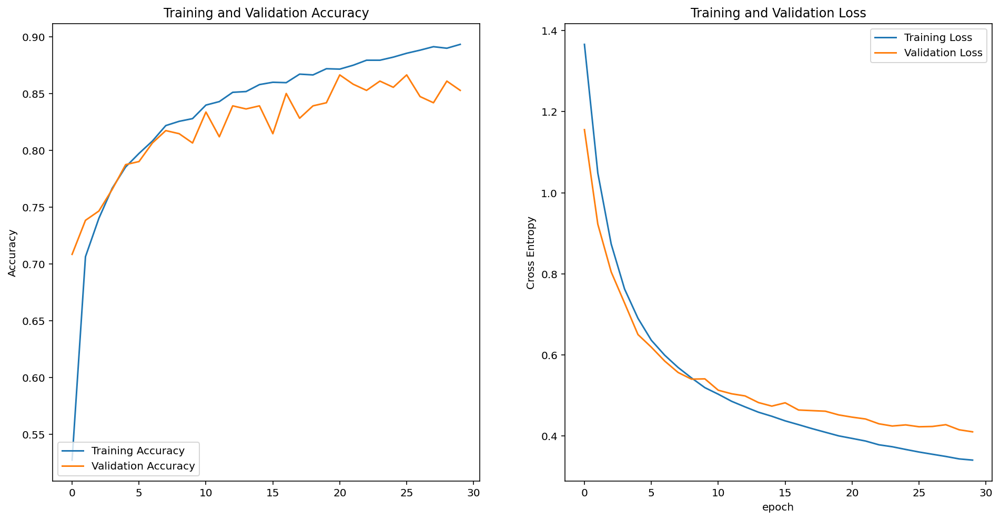

In [58]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower left')
plt.ylabel('Accuracy')
# plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
# plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [59]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

In [60]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 1, 3, 2, 0, 3, 2, 0, 2, 4, 2, 0,
       1, 0, 1, 3, 1, 4, 4, 3, 0, 4])

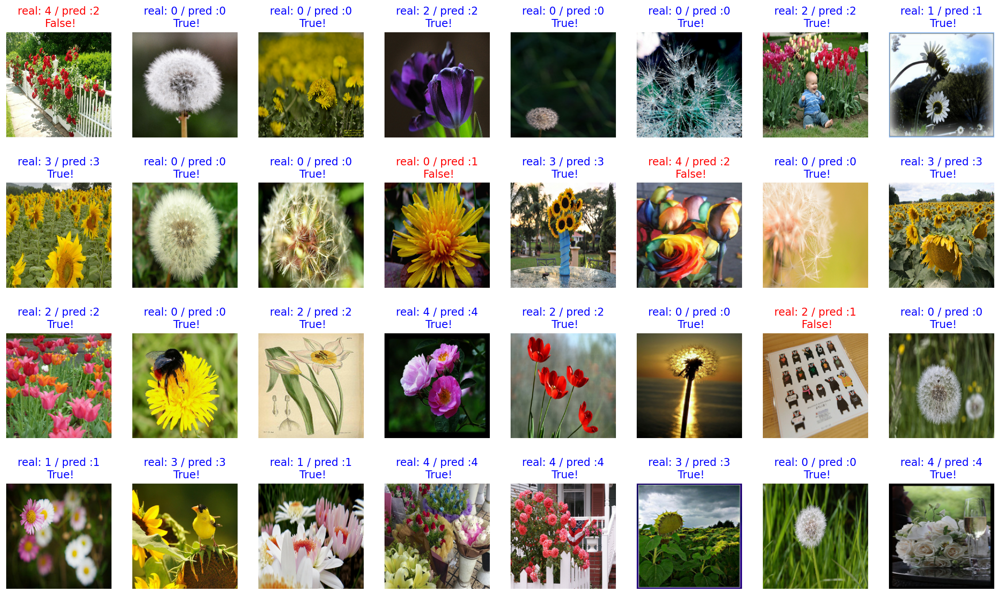

In [61]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [117]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, models

In [118]:
base_model = ResNet50(weights='imagenet', include_top=True, input_shape=(224, 224, 3))
base_model.trainable = False  # 사전 학습된 가중치 고정

In [119]:
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [129]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
dense_layer = tf.keras.layers.Dense(units = 512, activation = 'relu')
prediction_layer = tf.keras.layers.Dense(units = 5, activation = 'softmax')

In [130]:
model = tf.keras.Sequential([
  base_model,
#   global_average_layer,
  dense_layer,
  prediction_layer
])

In [131]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 1000)              25636712  
_________________________________________________________________
dense_19 (Dense)             (None, 512)               512512    
_________________________________________________________________
dense_20 (Dense)             (None, 5)                 2565      
Total params: 26,151,789
Trainable params: 515,077
Non-trainable params: 25,636,712
_________________________________________________________________


In [132]:
base_learning_rate = 0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [133]:
EPOCHS = 20
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 16s 124ms/step - loss: 1.5890 - accuracy: 0.2790 - val_loss: 1.5557 - val_accuracy: 0.3515
Epoch 2/20
92/92 [==============================] - 12s 120ms/step - loss: 1.5445 - accuracy: 0.3212 - val_loss: 1.5105 - val_accuracy: 0.3869
Epoch 3/20
92/92 [==============================] - 12s 118ms/step - loss: 1.5122 - accuracy: 0.3474 - val_loss: 1.4930 - val_accuracy: 0.3924
Epoch 4/20
92/92 [==============================] - 12s 122ms/step - loss: 1.4834 - accuracy: 0.3730 - val_loss: 1.4756 - val_accuracy: 0.3678
Epoch 5/20
92/92 [==============================] - 12s 121ms/step - loss: 1.4620 - accuracy: 0.3777 - val_loss: 1.4338 - val_accuracy: 0.4223
Epoch 6/20
92/92 [==============================] - 12s 124ms/step - loss: 1.4387 - accuracy: 0.3937 - val_loss: 1.4006 - val_accuracy: 0.4687
Epoch 7/20
92/92 [==============================] - 12s 119ms/step - loss: 1.4243 - accuracy: 0.4012 - val_loss: 1.3866 - val_accuracy: 0.4496

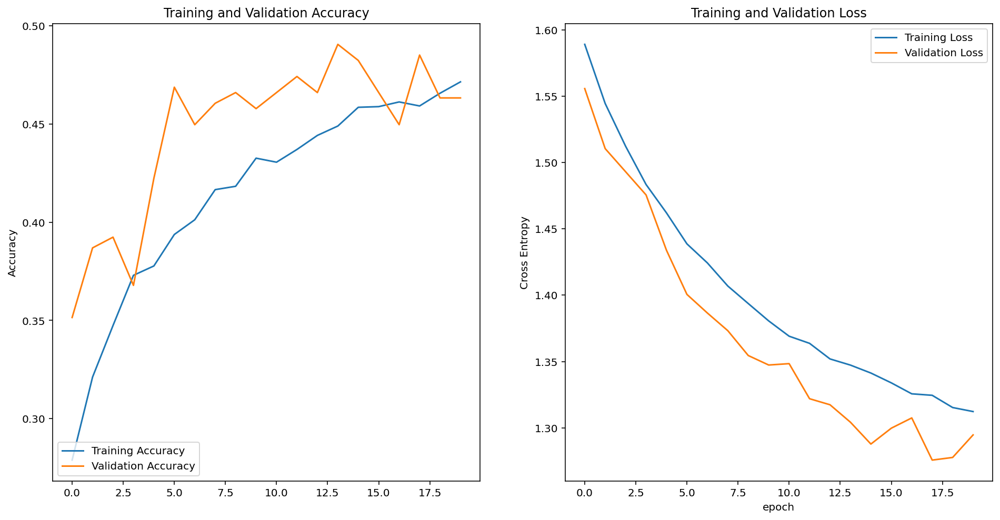

In [134]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower left')
plt.ylabel('Accuracy')
# plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
# plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [136]:
base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')

80150528/80134624 [==============================] - 0s 0us/step


In [137]:
base_model.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [138]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
dense_layer = tf.keras.layers.Dense(units = 512, activation = 'relu')
prediction_layer = tf.keras.layers.Dense(units = 5, activation = 'softmax')

In [139]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [140]:
model.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg19 (Functional)           (None, 7, 7, 512)         20024384  
_________________________________________________________________
global_average_pooling2d_9 ( (None, 512)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_22 (Dense)             (None, 5)                 2565      
Total params: 20,289,605
Trainable params: 20,289,605
Non-trainable params: 0
_________________________________________________________________


In [141]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [142]:
EPOCHS = 20
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
92/92 [==============================] - 62s 545ms/step - loss: 1.5112 - accuracy: 0.3668 - val_loss: 1.0673 - val_accuracy: 0.6076
Epoch 2/20
92/92 [==============================] - 46s 497ms/step - loss: 1.0620 - accuracy: 0.5851 - val_loss: 0.8176 - val_accuracy: 0.6458
Epoch 3/20
92/92 [==============================] - 49s 525ms/step - loss: 0.8248 - accuracy: 0.7108 - val_loss: 0.5976 - val_accuracy: 0.7766
Epoch 4/20
92/92 [==============================] - 48s 518ms/step - loss: 0.7721 - accuracy: 0.7394 - val_loss: 0.7297 - val_accuracy: 0.7439
Epoch 5/20
92/92 [==============================] - 50s 533ms/step - loss: 0.6096 - accuracy: 0.7813 - val_loss: 0.5207 - val_accuracy: 0.7984
Epoch 6/20
92/92 [==============================] - 50s 537ms/step - loss: 0.6047 - accuracy: 0.7909 - val_loss: 0.6459 - val_accuracy: 0.7139
Epoch 7/20
92/92 [==============================] - 50s 535ms/step - loss: 0.5451 - accuracy: 0.8151 - val_loss: 0.5137 - val_accuracy: 0.8174

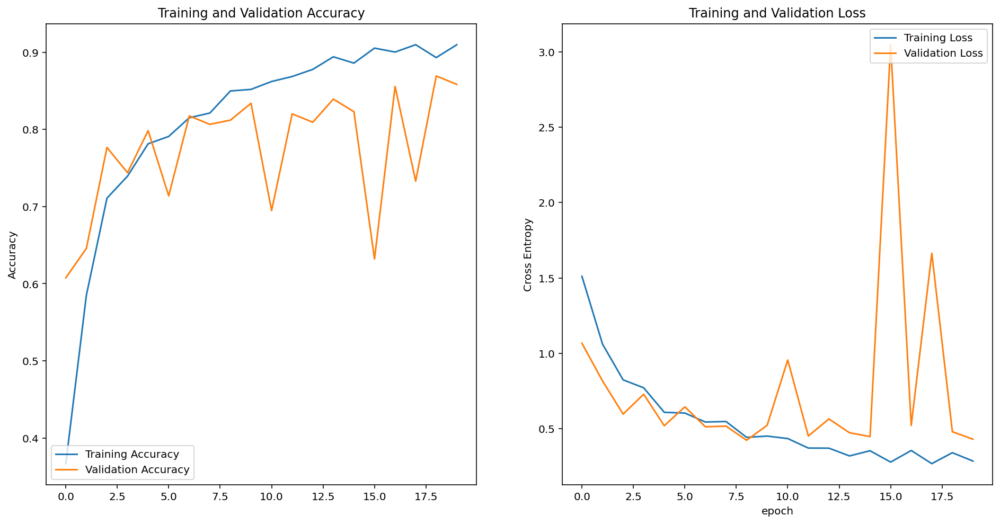

In [143]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower left')
plt.ylabel('Accuracy')
# plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
# plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [158]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
import keras

In [154]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainble = False

In [155]:
x = base_model.output
x = GlobalAveragePooling2D()(x)  # 경량화된 특성 추출
x = Dense(1024, activation='relu')(x)
x = Dropout(0.3)(x)  # Dropout으로 과적합 방지
outputs = Dense(5, activation='softmax')(x)  # 6개 클래스 분류
model = Model(base_model.input, outputs)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_12[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [156]:
model.compile(
    optimizer=Adam(learning_rate=0.0001),   # Adam 최적화 알고리즘 (일반적으로 잘 동작)
    loss='sparse_categorical_crossentropy',  # 타겟의 출력이 원-핫 인코딩된 형태가 아니라 정수형 라벨로 되어 있음. 다중 클래스 분류를 위한 손실 함수
    metrics=['accuracy']  # 모델의 정확도를 평가 지표로 사용
)

In [160]:
callbacks = [
   keras.callbacks.ModelCheckpoint(
    'ResNet_model.keras',  # 모델 저장 경로
    monitor='val_loss',    # 검증 손실을 기준으로 저장
    save_best_only=True,  # 가장 좋은 모델만 저장
    verbose=1)             # 저장 시 메시지 출력
]

history = model.fit(
    train_batches,  # 훈련 데이터
    epochs=50,
    validation_data=validation_batches,  # 검증 데이터
    callbacks=callbacks)

Epoch 1/50
92/92 [==============================] - 41s 371ms/step - loss: 0.4623 - accuracy: 0.8341 - val_loss: 3.1832 - val_accuracy: 0.2425

Epoch 00001: val_loss improved from inf to 3.18317, saving model to ResNet_model.keras
Epoch 2/50
92/92 [==============================] - 33s 352ms/step - loss: 0.1033 - accuracy: 0.9659 - val_loss: 1.7515 - val_accuracy: 0.2888

Epoch 00002: val_loss improved from 3.18317 to 1.75150, saving model to ResNet_model.keras
Epoch 3/50
92/92 [==============================] - 34s 362ms/step - loss: 0.0438 - accuracy: 0.9864 - val_loss: 2.3972 - val_accuracy: 0.2861

Epoch 00003: val_loss did not improve from 1.75150
Epoch 4/50
92/92 [==============================] - 33s 353ms/step - loss: 0.0433 - accuracy: 0.9857 - val_loss: 2.0930 - val_accuracy: 0.3978

Epoch 00004: val_loss did not improve from 1.75150
Epoch 5/50
92/92 [==============================] - 33s 354ms/step - loss: 0.0568 - accuracy: 0.9823 - val_loss: 1.4802 - val_accuracy: 0.5559



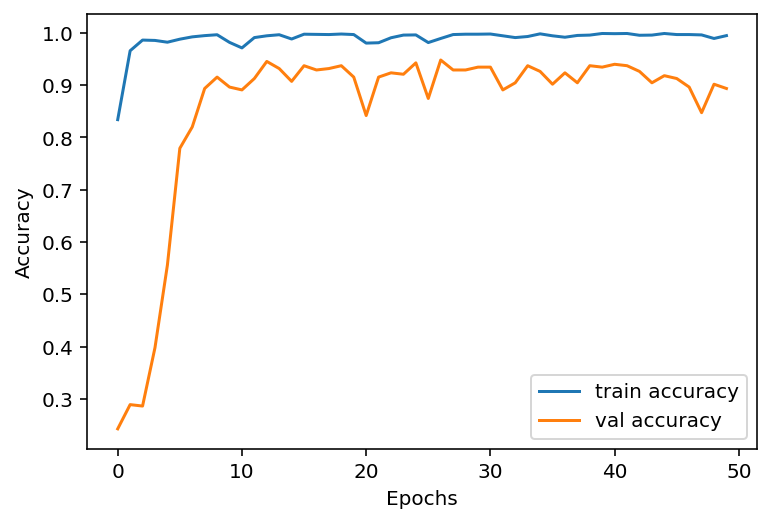

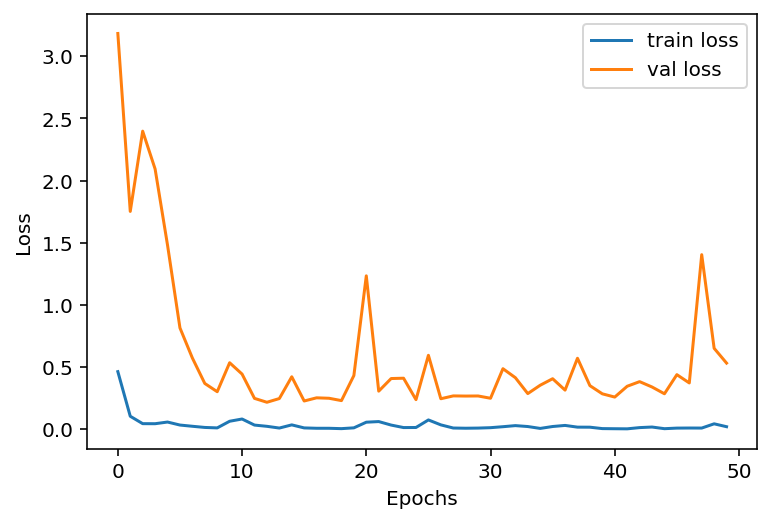

In [161]:
# 훈련 정확도와 검증 정확도 시각화
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# 훈련 손실과 검증 손실 시각화
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [164]:
test_loss, test_accuracy = model.evaluate(test_batches, verbose=2)

# 평가 결과 출력
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

12/12 - 1s - loss: 0.4037 - accuracy: 0.9183
Test Loss: 0.40373408794403076
Test Accuracy: 0.9182561039924622


In [165]:
model1 = tf.keras.models.load_model('ResNet_model.keras')

test_loss, test_accuracy = model1.evaluate(test_batches, verbose=2)

# 평가 결과 출력
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

12/12 - 2s - loss: 0.0888 - accuracy: 0.9673
Test Loss: 0.08875691145658493
Test Accuracy: 0.9673024415969849


In [170]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model1.predict(image_batch)
    pass

In [171]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([4, 0, 0, 2, 0, 0, 2, 1, 3, 0, 0, 2, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 3, 1, 4, 4, 3, 0, 4])

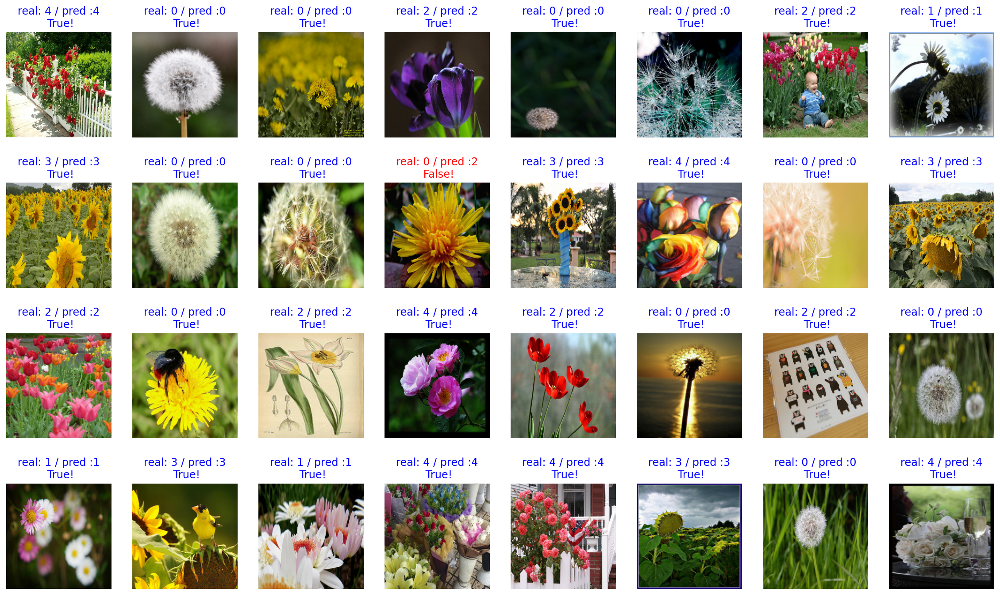

In [172]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [174]:
model1.save('flowers_model.keras',save_format='tf')

회고
```
여러가지 모델을 적용 해보면서 분류기에는 내 입맛에 맞게 만들어 보았지만 모델 성능들이 상당히 좋지 않게 나왔다.
역시 경험이 중요하다는걸 깨달았으며 만들어진 모델이 최고라는걸 다시 한번 느꼈다.
플러터까지 구현해 보고 싶었지만 모든걸 잊어버렸다는걸 느껴버렸고 api 구축에 대해 다시금 공부가 필요하다고 생각했다.
```